<a href="https://colab.research.google.com/github/SYasheel/AutomaticSleepScoring/blob/main/Yasheel/overlaid_plots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Whole purpose of this notebook is to make overlaid plots of raw and filtered emd cycles and additionally employing amplitude thresholds/ cycle duratinos etc. to maybe filter out delta cycles properly

we started with checkign histograms of amplitude distribution because in random sampling of waveforms in pca/kmeana file the amplitufe values were very low

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/cn/donders/Nikhil')

In [ ]:
import os
import pandas as pd

os.chdir('/content/drive/MyDrive/cn/donders/')

In [ ]:
hpc_nf=pd.read_hdf('HPC_combined_resampled_data.h5') # nf:no filtering (allgood cycles though) i.e. is_good ==1



In [ ]:
hpc_nf_rat3_pt3= hpc_nf[(hpc_nf['Post_Trial'] == 3) & (hpc_nf['rat_id'] == 3)]


In [ ]:
hpc_nf_rat3_pt3.tail()#nikhils framework

,index,is_good,start_sample,stop_sample,duration,duration_samples,peak2trough,asc2desc,max_amp,trough_values,...,119,120,121,122,123,124,125,126,127,rat_id
65561,2929,1,6709437,6710327,891,891,0.334685,0.508426,0.641983,-0.640817,...,-0.153935,-0.133580,-0.113485,-0.093703,-0.074285,-0.055279,-0.036734,-0.018696,-0.001210,3
65562,2930,1,6710328,6710893,566,566,0.555368,0.464681,0.405651,-0.117141,...,-0.058154,-0.051940,-0.045449,-0.038691,-0.031673,-0.024403,-0.016891,-0.009143,-0.001173,3
65563,2931,1,6710894,6712268,1375,1375,0.599471,0.464036,0.833034,-0.541628,...,-0.251461,-0.221313,-0.190553,-0.159337,-0.127826,-0.096177,-0.064548,-0.033094,-0.001968,3
65564,2939,1,6719194,6720045,852,852,0.355268,0.496031,1.499327,-1.071172,...,-0.359060,-0.315409,-0.271367,-0.227040,-0.182532,-0.137945,-0.093384,-0.048948,-0.004739,3
65565,2941,1,6721790,6722578,789,789,0.493373,0.517596,1.602425,-0.997082,...,-0.451631,-0.401241,-0.349217,-0.295670,-0.240707,-0.184453,-0.127028,-0.068558,-0.009169,3


percentile based distribution of max_amp per rat

In [ ]:
import pandas as pd
#change imput value of quantile to facilitate percentile based lot accordingly (0-1)
hpc = (
    hpc_nf.groupby('rat_id', group_keys=False)
       .apply(lambda group: group[group['max_amp'] > group['max_amp'].quantile(0.25)])
)
#if needed reset index
hpc = hpc.reset_index(drop=True)

/tmp/ipython-input-1118844981.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group[group['max_amp'] > group['max_amp'].quantile(0.25)])


in the followiing results, we could see that good chink of cycles have very low amplitudes, so we decided to plot the complete signal not just waveforms.

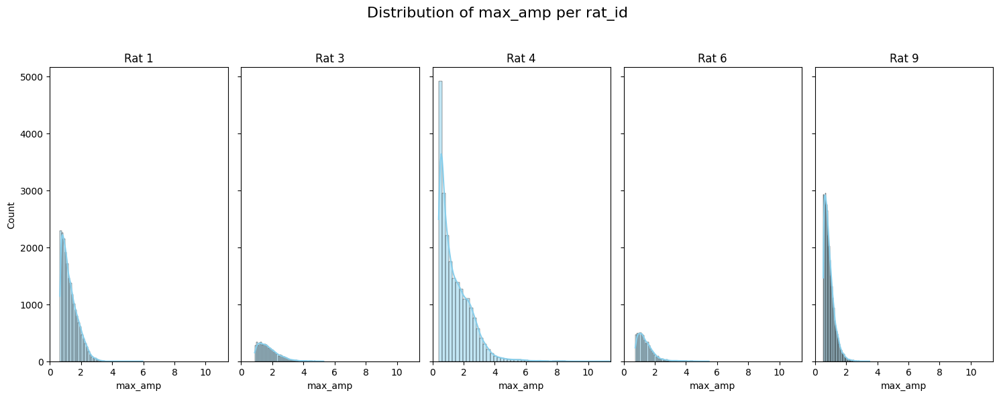

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique rat_ids
rat_ids = sorted(hpc['rat_id'].unique())

# Create subplots
fig, axes = plt.subplots(1, 5, figsize=(15, 6), sharey=True)

# Determine global x-axis limit
global_max = hpc_nf['max_amp'].max()

# Plot each rat_id separately
for i, rat in enumerate(rat_ids):
    ax = axes[i]
    sns.histplot(hpc[hpc['rat_id'] == rat]['max_amp'], bins=50, kde=True, ax=ax, color='skyblue')
    ax.set_title(f'Rat {rat}')
    ax.set_xlim(0, global_max)  # ensure same x-axis for all
    ax.set_xlabel('max_amp')
    if i == 0:
        ax.set_ylabel('Count')
    else:
        ax.set_ylabel('')

plt.suptitle('Distribution of max_amp per rat_id ', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


among so many rats and pts, delta oscillations are hallmark of nrem sleep, so plotted some hypnograms to choose where we could se sleep state ==3 occured for significant time

hypnograms///// to be added from vs code

this is good+bad start(based on hypnograms we chose rat3 pt3)

In [ ]:
os.chdir('/content/drive/MyDrive/')

In [ ]:
#because of large size of files i have selectively made good+bad cycle dataframe for rat3 hpc region(there is a mistake in naming hte parent file/it has pt 1/2/3 data)
hpc_nf_allcycles_rat3=pd.read_hdf('HPCrat3_pt3_hpc_allcycles.h5') #/content/cycles_data/HPC_resampled_cycles_data_rat3_hpc.h5

In [ ]:
hpc_nf_allcycles_pt3_rat3=hpc_nf_allcycles_rat3[hpc_nf_allcycles_rat3['Post_Trial']==3]

In [ ]:
a=hpc_nf_allcycles_pt3_rat3[hpc_nf_allcycles_pt3_rat3['is_good'] == 1]
a.tail()

,is_good,start_sample,stop_sample,duration,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,...,118,119,120,121,122,123,124,125,126,127
2929,1,6709437,6710327,891,891,0.334685,0.508426,0.641983,-0.640817,0.195266,...,-0.174499,-0.153935,-0.133580,-0.113485,-0.093703,-0.074285,-0.055279,-0.036734,-0.018696,-0.001210
2930,1,6710328,6710893,566,566,0.555368,0.464681,0.405651,-0.117141,0.184659,...,-0.064087,-0.058154,-0.051940,-0.045449,-0.038691,-0.031673,-0.024403,-0.016891,-0.009143,-0.001173
2931,1,6710894,6712268,1375,1375,0.599471,0.464036,0.833034,-0.541628,0.543814,...,-0.280840,-0.251461,-0.221313,-0.190553,-0.159337,-0.127826,-0.096177,-0.064548,-0.033094,-0.001968
2939,1,6719194,6720045,852,852,0.355268,0.496031,1.499327,-1.071172,0.175479,...,-0.402221,-0.359060,-0.315409,-0.271367,-0.227040,-0.182532,-0.137945,-0.093384,-0.048948,-0.004739
2941,1,6721790,6722578,789,789,0.493373,0.517596,1.602425,-0.997082,0.490454,...,-0.500284,-0.451631,-0.401241,-0.349217,-0.295670,-0.240707,-0.184453,-0.127028,-0.068558,-0.009169


In [ ]:
pfc_nf=pd.read_hdf('PFC_combined_resampled_data.h5')

In [ ]:
pfc_nf['State'].unique()

array([1, 0, 3, 4, 5], dtype=uint8)

Now we need to backtrack raw data!!!

In [ ]:
#loading raw hpc rat3 post trial 3 data
#firstly lets upload raw data
import os
os.chdir('/content/drive/MyDrive/cn/donders/rat3_orn')
from scipy.io import loadmat
raw_post_trial_3_data=loadmat('Cleaned_Trial3_HPC_100_CH15.continuous.mat')

In [ ]:
raw_post_trial_3_data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'HPClfpCleaned'])

In [ ]:
raw_post_trial_3_data=raw_post_trial_3_data['HPClfpCleaned']

In [ ]:
#z_score normalization of raw data
import numpy as np
from scipy.stats import zscore
zscored_raw_post_trial_3_data = zscore(raw_post_trial_3_data, axis=0)


In [ ]:
zscored_raw_post_trial_3_data.shape

(6752384, 1)

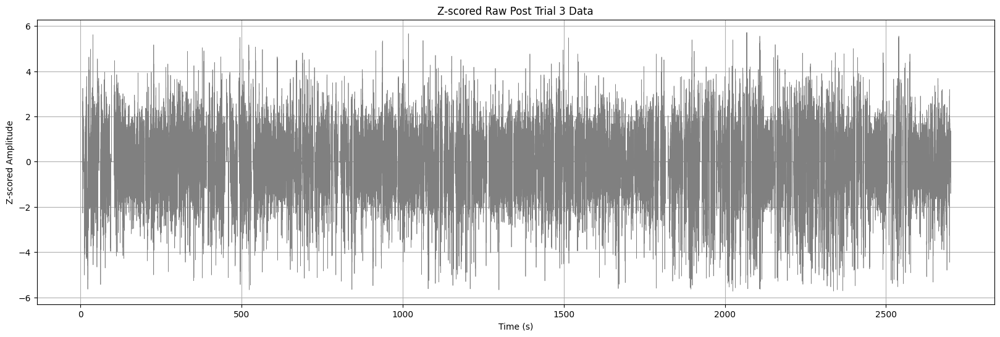

In [ ]:
# since the raw data is sample indexed, using sampling frequency getting the real time axis and plotting
import matplotlib.pyplot as plt
import numpy as np
sampling_frequency = 2500
data_length = len(zscored_raw_post_trial_3_data)

# Creating the time axis
time_axis = np.arange(data_length) / sampling_frequency

# plotting
plt.figure(figsize=(20, 6))
plt.plot(time_axis, zscored_raw_post_trial_3_data, color='grey', linewidth=0.5)
plt.title('Z-scored Raw Post Trial 3 Data')
plt.xlabel('Time (s)')
plt.ylabel('Z-scored Amplitude')
plt.grid(True)
plt.show()

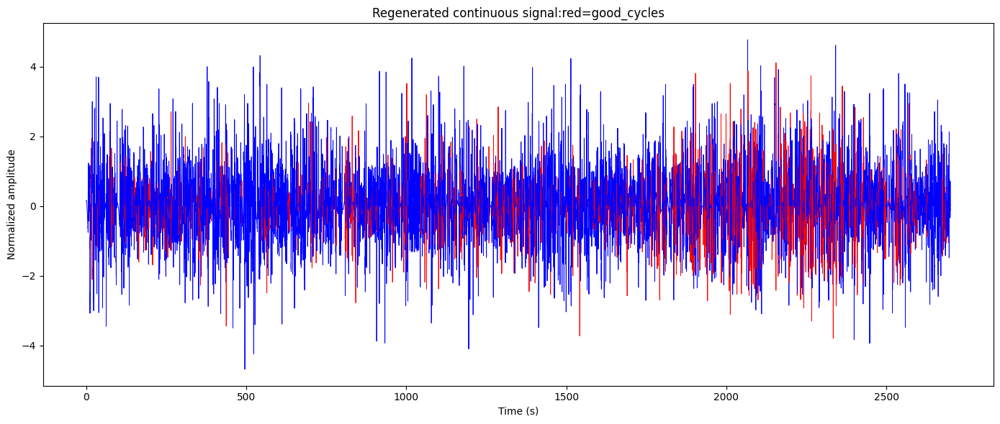

In [ ]:

# we will concatenate all waveforms one after another based on their actual time duration
df = hpc_nf_allcycles_pt3_rat3.copy()

# Sampling frequency
fs = 2500.0

# Column names
start_col = 'start_sample'
stop_col = 'stop_sample'
good_col = 'is_good'

# Last 128 columns are waveform values
waveform_cols = df.columns[-128:]

# Sort by start sample to ensure time continuity
df_sorted = df.sort_values(by=start_col)

# Initialize lists to collect the full signal and corresponding time and color
full_signal = []
full_time = []
full_colors = []

# Track the current time
current_time = 0.0

for _, row in df_sorted.iterrows():
    start_sample = row[start_col]
    stop_sample = row[stop_col]
    duration_sec = (stop_sample - start_sample) / fs
    t = np.linspace(current_time, current_time + duration_sec, 128)

    wave = row[waveform_cols].to_numpy(dtype=float)

    if np.isnan(wave).any():
        wave[:] = 0.0
        color = 'green'
    else:
        color = 'blue' if row[good_col] == 0 else 'red'

    full_signal.append(wave)
    full_time.append(t)
    full_colors.append(color)

    current_time += duration_sec

# Convert to arrays
full_signal = np.concatenate(full_signal)
full_time = np.concatenate(full_time)

# Plot in segments according to their color
fig, ax = plt.subplots(figsize=(14, 6))
start = 0
for wave, t, color in zip(df_sorted[waveform_cols].to_numpy(dtype=float), full_time.reshape(-1, 128), full_colors):
    end = start + 128
    ax.plot(full_time[start:end], full_signal[start:end], color=color, linewidth=0.7)
    start = end

ax.set_xlabel('Time (s)')
ax.set_ylabel('Normalized amplitude')
ax.set_title('Regenerated continuous signal:red=good_cycles')
plt.tight_layout()
plt.show()


plotting in 40 sec windows

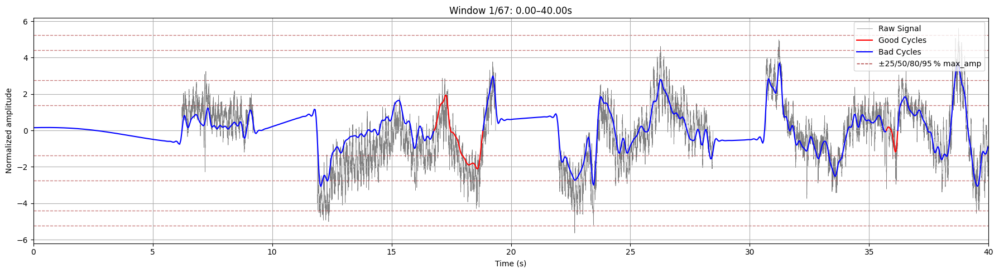

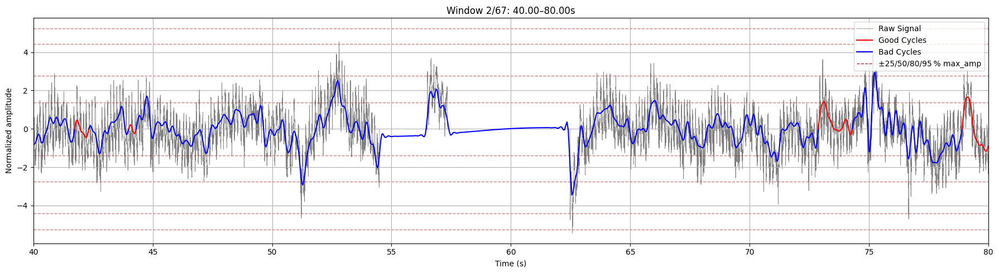

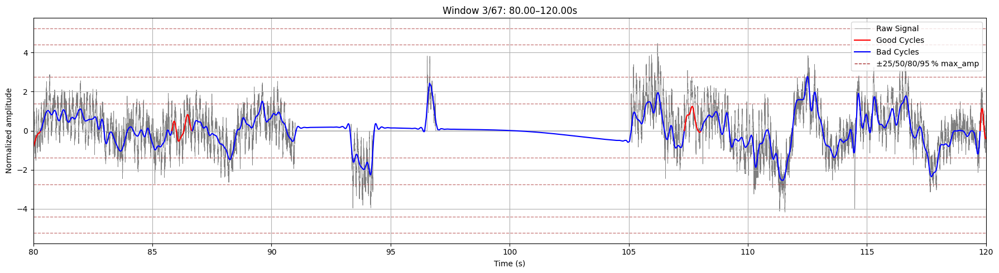

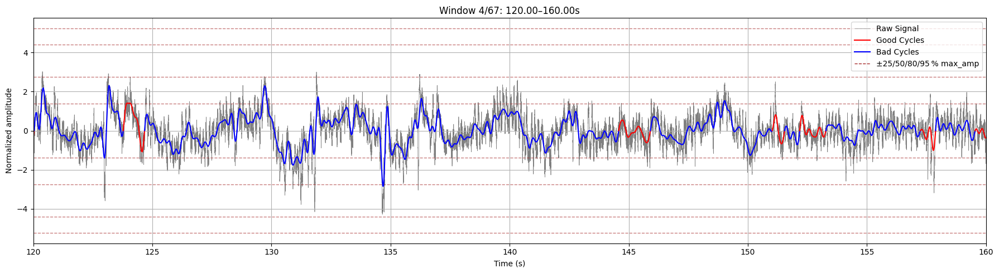

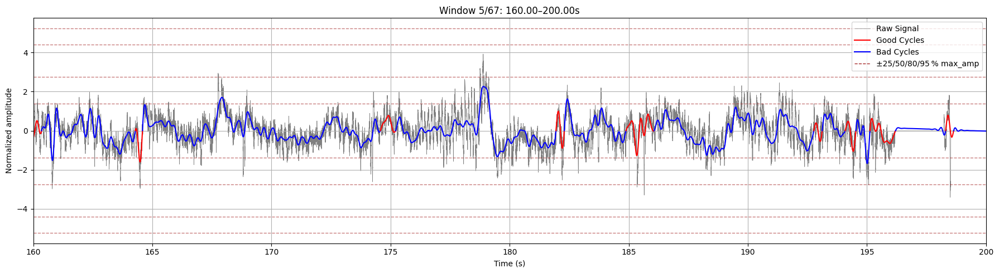

...

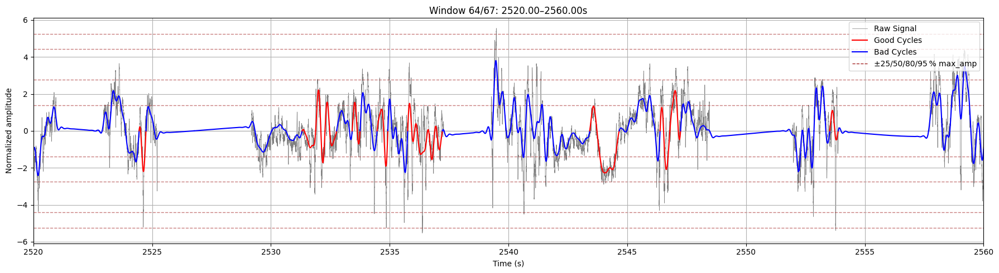

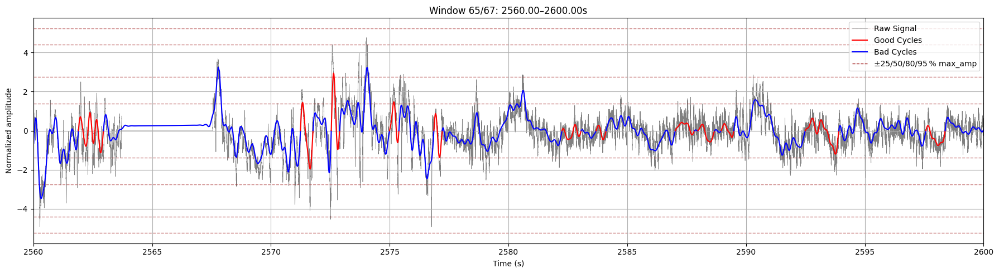

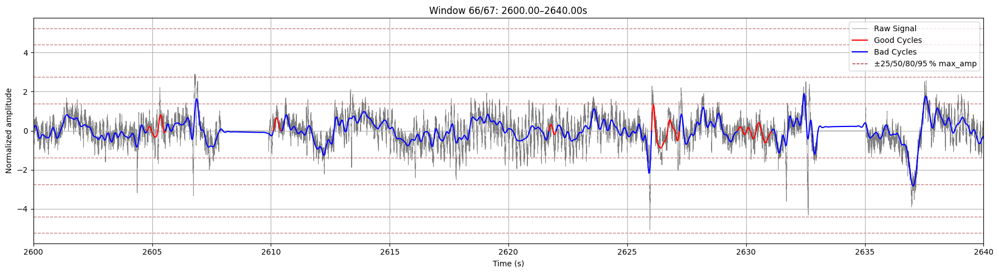

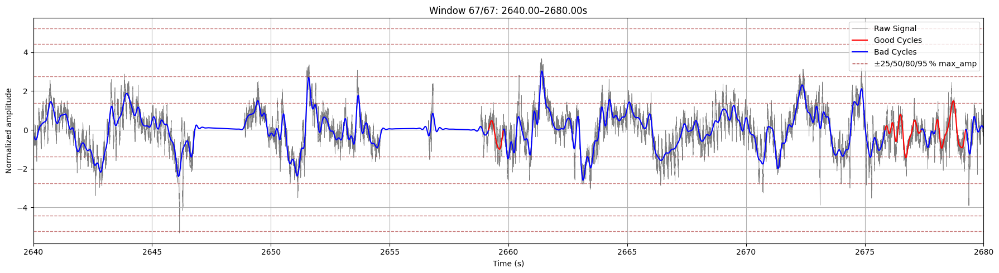

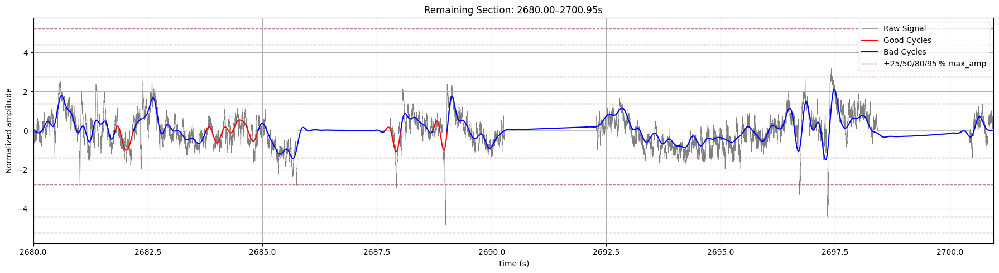

Saved 68 figure(s) in: /content/drive/My Drive/rat3_pt3_hpc_overlay_competesignal/signal_plots


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
#urser configuration
window_size_seconds = 40
df          = hpc_nf_allcycles_pt3_rat3.copy()
fs          = sampling_frequency            # Hz
start_col   = 'start_sample'
stop_col    = 'stop_sample'
good_col    = 'is_good'
waveform_cols = df.columns[-128:]           # last 128 cols are waveforms

# path to save the plos
save_dir = "/content/drive/My Drive/rat3_pt3_hpc_overlay_competesignal/signal_plots"
os.makedirs(save_dir, exist_ok=True)


# sorting cyles for time‑correct plotting/redundant step but better safe
df_sorted = df.sort_values(by=start_col)

# global max_amp thresholds
max_amp_global = df['max_amp'].max()
frac_levels    = [0.25, 0.50, 0.80, 0.95]
hlevels        = [f * max_amp_global for f in frac_levels]


total_raw_duration_seconds = time_axis[-1] if len(time_axis) else 0
num_windows = int(total_raw_duration_seconds // window_size_seconds)

def add_reference_lines(ax):
    """Draw ±25/50/80/95 % of max_amp on given axes."""
    for lvl in hlevels:
        ax.axhline( y= lvl, color='brown', linestyle='--',
                    linewidth=1, alpha=0.6, zorder=1 )
        ax.axhline( y=-lvl, color='brown', linestyle='--',
                    linewidth=1, alpha=0.6, zorder=1 )

def legend_handles():
    """Return proxy artists for the legend."""
    return [
        Line2D([0], [0], color='grey',   lw=0.5, label='Raw Signal'),
        Line2D([0], [0], color='red',    lw=1.5, label='Good Cycles'),
        Line2D([0], [0], color='blue',   lw=1.5, label='Bad Cycles'),

        Line2D([0], [0], color='brown', lw=1, linestyle='--',
               label='±25/50/80/95 % max_amp')
    ]

# main loop
for i in range(num_windows):
    start_time_plot = i * window_size_seconds
    end_time_plot   = start_time_plot + window_size_seconds

    # slice raw signal to current 40‑s window
    raw_start_idx = np.searchsorted(time_axis, start_time_plot, side='left')
    raw_end_idx   = np.searchsorted(time_axis, end_time_plot,   side='right')
    raw_time_win  = time_axis[raw_start_idx:raw_end_idx]
    raw_data_win  = zscored_raw_post_trial_3_data[raw_start_idx:raw_end_idx]

    fig, ax = plt.subplots(figsize=(18,5))
    ax.plot(raw_time_win, raw_data_win,
            color='grey', linewidth=0.5, zorder=0)

    add_reference_lines(ax)

    # overlay regenerated segments that overlap this window
    for _, row in df_sorted.iterrows():
        seg_time = np.linspace(row[start_col] / fs,
                               row[stop_col]  / fs, 128)
        if seg_time[-1] < start_time_plot or seg_time[0] > end_time_plot:
            continue  # no overlap

        wave = row[waveform_cols].to_numpy(dtype=float)
        if np.isnan(wave).any():
            color = 'green'
        else:
            color = 'blue' if row[good_col] == 0 else 'red'

        mask = (seg_time >= start_time_plot) & (seg_time <= end_time_plot)
        ax.plot(seg_time[mask], wave[mask], color=color,
                linewidth=1.5, zorder=2)

    # display settings
    ax.set_xlim(start_time_plot, end_time_plot)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Normalized amplitude')
    ax.set_title(f'Window {i+1}/{num_windows}: '
                 f'{start_time_plot:.2f}–{end_time_plot:.2f}s')
    ax.grid(True)
    ax.legend(handles=legend_handles(), loc='upper right')
    plt.tight_layout()

    #display
    fname = f"window_{i+1:03d}_{start_time_plot:.0f}-{end_time_plot:.0f}s.png"
    fig.savefig(os.path.join(save_dir, fname), dpi=300)
    plt.show()
    plt.close(fig)

#in case we have some remaining signal oustisde of 40 window complete windows
remaining = total_raw_duration_seconds - num_windows * window_size_seconds
if remaining > 0 or num_windows == 0:
    start_time_plot = num_windows * window_size_seconds
    end_time_plot   = total_raw_duration_seconds

    raw_start_idx = np.searchsorted(time_axis, start_time_plot, side='left')
    raw_end_idx   = np.searchsorted(time_axis,   end_time_plot, side='right')
    raw_time_win  = time_axis[raw_start_idx:raw_end_idx]
    raw_data_win  = zscored_raw_post_trial_3_data[raw_start_idx:raw_end_idx]

    fig, ax = plt.subplots(figsize=(18, 5))
    ax.plot(raw_time_win, raw_data_win,
            color='grey', linewidth=0.5, zorder=0)

    add_reference_lines(ax)

    for _, row in df_sorted.iterrows():
        seg_time = np.linspace(row[start_col] / fs,
                               row[stop_col]  / fs, 128)
        if seg_time[-1] < start_time_plot or seg_time[0] > end_time_plot:
            continue

        wave = row[waveform_cols].to_numpy(dtype=float)
        if np.isnan(wave).any():
            color = 'green'
        else:
            color = 'blue' if row[good_col] == 0 else 'red'

        mask = (seg_time >= start_time_plot) & (seg_time <= end_time_plot)
        ax.plot(seg_time[mask], wave[mask], color=color,
                linewidth=1.5, zorder=2)

    ax.set_xlim(start_time_plot, end_time_plot)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Normalized amplitude')
    label = "Full Signal" if num_windows == 0 else "Remaining Section"
    ax.set_title(f'{label}: {start_time_plot:.2f}–{end_time_plot:.2f}s')
    ax.grid(True)
    ax.legend(handles=legend_handles(), loc='upper right')
    plt.tight_layout()

    rem_fname = ("full_signal.png" if num_windows == 0
                 else f"remainder_{start_time_plot:.0f}-{end_time_plot:.0f}s.png")
    fig.savefig(os.path.join(save_dir, rem_fname), dpi=300)
    plt.show()
    plt.close(fig)

print(f"Saved {len(os.listdir(save_dir))} figure(s) in: {save_dir}")


hereafter we decided to employ mask_Sift using emd